<h1><center>Car Price Prediction Using Machine Learning</center></h1>

### Objective statement

The task at hand involves creating a predictive model for the resale value of pre-owned cars, utilizing the information provided in the datasets. The objective is to assist the client in estimating the price of a desired car. As a data scientist, the goal is to enhance the likelihood of the client acquiring the chosen vehicle while ensuring they do not exceed a reasonable payment.

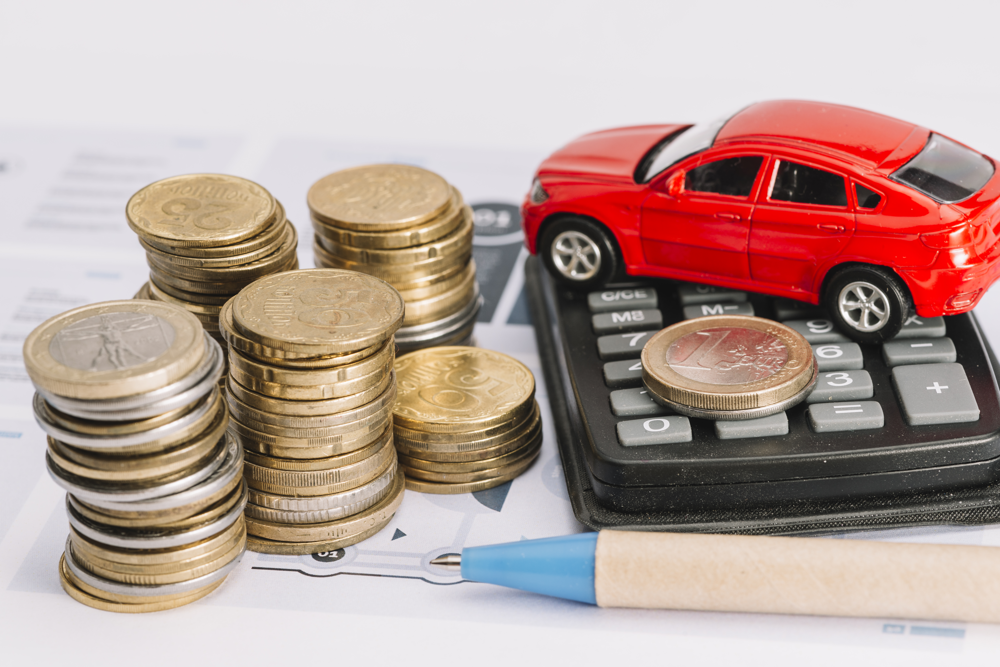

This project lifecycle consists of three main phases:

- Exploratory Data Analysis

- Feature Engineering

- Model Training

Dataset Link : https://www.kaggle.com/datasets/vijayaadithyanvg/car-price-predictionused-cars

## `Exploratory Data Analysis`

### 1. Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn import metrics
from sklearn.metrics import r2_score
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### 2. Importing Dataset

In [2]:
df = pd.read_csv('car data.csv')
df

,Car_Name,Year,Selling_Price,Present_Price,Driven_kms,Fuel_Type,Selling_type,Transmission,Owner
0,ritz,2014,3.35,5.59,27000,Petrol,Dealer,Manual,0
1,sx4,2013,4.75,9.54,43000,Diesel,Dealer,Manual,0
2,ciaz,2017,7.25,9.85,6900,Petrol,Dealer,Manual,0
3,wagon r,2011,2.85,4.15,5200,Petrol,Dealer,Manual,0
4,swift,2014,4.60,6.87,42450,Diesel,Dealer,Manual,0
...,...,...,...,...,...,...,...,...,...
296,city,2016,9.50,11.60,33988,Diesel,Dealer,Manual,0
297,brio,2015,4.00,5.90,60000,Petrol,Dealer,Manual,0
298,city,2009,3.35,11.00,87934,Petrol,Dealer,Manual,0
299,city,2017,11.50,12.50,9000,Diesel,Dealer,Manual,0


### 3. Display Top 5 Rows of The Dataset

In [3]:
df.head()

,Car_Name,Year,Selling_Price,Present_Price,Driven_kms,Fuel_Type,Selling_type,Transmission,Owner
0,ritz,2014,3.35,5.59,27000,Petrol,Dealer,Manual,0
1,sx4,2013,4.75,9.54,43000,Diesel,Dealer,Manual,0
2,ciaz,2017,7.25,9.85,6900,Petrol,Dealer,Manual,0
3,wagon r,2011,2.85,4.15,5200,Petrol,Dealer,Manual,0
4,swift,2014,4.60,6.87,42450,Diesel,Dealer,Manual,0


### 4. Display Last 5 Rows of The Dataset

In [4]:
df.tail()

,Car_Name,Year,Selling_Price,Present_Price,Driven_kms,Fuel_Type,Selling_type,Transmission,Owner
296,city,2016,9.50,11.6,33988,Diesel,Dealer,Manual,0
297,brio,2015,4.00,5.9,60000,Petrol,Dealer,Manual,0
298,city,2009,3.35,11.0,87934,Petrol,Dealer,Manual,0
299,city,2017,11.50,12.5,9000,Diesel,Dealer,Manual,0
300,brio,2016,5.30,5.9,5464,Petrol,Dealer,Manual,0


### 5. Find Shape of Our Dataset (Number of Rows And Number of Columns)

In [5]:
df.shape

(301, 9)

In [6]:
print("Number of Rows:",df.shape[0])
print("Number of Columns:",df.shape[1])

Number of Rows: 301
Number of Columns: 9


### 6. Variable Descritption

- **Car_Name**: The model or name of the car.

    
- **Year**: The manufacturing year of the car.

    
- **Selling_Price**: The resale price of the car.

    
- **Present_Price**: The current market price of the car.

    
- **Driven_kms**: The total distance the car has been driven.

    
- **Fuel_Type**: The type of fuel the car uses (e.g., Petrol, Diesel).

    
- **Selling_type**: Whether the car is sold by a dealer or an individual.

    
- **Transmission**: The type of transmission (e.g., Manual, Automatic).

    
- **Owner**: The number of previous owners of the car.

### 7. Retrieve dataset details, including the total rows and columns, column data types, and memory usage.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301 entries, 0 to 300
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Car_Name       301 non-null    object 
 1   Year           301 non-null    int64  
 2   Selling_Price  301 non-null    float64
 3   Present_Price  301 non-null    float64
 4   Driven_kms     301 non-null    int64  
 5   Fuel_Type      301 non-null    object 
 6   Selling_type   301 non-null    object 
 7   Transmission   301 non-null    object 
 8   Owner          301 non-null    int64  
dtypes: float64(2), int64(3), object(4)
memory usage: 21.3+ KB


## `Feature Engineering`

### 1. Check Null Values In The Dataset

In [8]:
df.isnull().sum()

Car_Name         0
Year             0
Selling_Price    0
Present_Price    0
Driven_kms       0
Fuel_Type        0
Selling_type     0
Transmission     0
Owner            0
dtype: int64

### 2. Get Overall Statistics About The Dataset

In [9]:
df.describe()

,Year,Selling_Price,Present_Price,Driven_kms,Owner
count,301.000000,301.000000,301.000000,301.000000,301.000000
mean,2013.627907,4.661296,7.628472,36947.205980,0.043189
std,2.891554,5.082812,8.642584,38886.883882,0.247915
min,2003.000000,0.100000,0.320000,500.000000,0.000000
25%,2012.000000,0.900000,1.200000,15000.000000,0.000000
50%,2014.000000,3.600000,6.400000,32000.000000,0.000000
75%,2016.000000,6.000000,9.900000,48767.000000,0.000000
max,2018.000000,35.000000,92.600000,500000.000000,3.000000


### 3. checking the distribution of categorical data

In [10]:
for column in ["Fuel_Type", "Selling_type", "Transmission"]:
    if df[column].dtype == object:
        print(str(column) + ":" + str(df[column].unique()))
        print(df[column].value_counts())
        print("---------------------------------------------------------------------")

Fuel_Type:['Petrol' 'Diesel' 'CNG']
Petrol    239
Diesel     60
CNG         2
Name: Fuel_Type, dtype: int64
---------------------------------------------------------------------
Selling_type:['Dealer' 'Individual']
Dealer        195
Individual    106
Name: Selling_type, dtype: int64
---------------------------------------------------------------------
Transmission:['Manual' 'Automatic']
Manual       261
Automatic     40
Name: Transmission, dtype: int64
---------------------------------------------------------------------


### 4. Data Preprocessing

In [11]:
import datetime
date_time = datetime.datetime.now()
df['Age of car'] = date_time.year - df['Year'] 
df

,Car_Name,Year,Selling_Price,Present_Price,Driven_kms,Fuel_Type,Selling_type,Transmission,Owner,Age of car
0,ritz,2014,3.35,5.59,27000,Petrol,Dealer,Manual,0,9
1,sx4,2013,4.75,9.54,43000,Diesel,Dealer,Manual,0,10
2,ciaz,2017,7.25,9.85,6900,Petrol,Dealer,Manual,0,6
3,wagon r,2011,2.85,4.15,5200,Petrol,Dealer,Manual,0,12
4,swift,2014,4.60,6.87,42450,Diesel,Dealer,Manual,0,9
...,...,...,...,...,...,...,...,...,...,...
296,city,2016,9.50,11.60,33988,Diesel,Dealer,Manual,0,7
297,brio,2015,4.00,5.90,60000,Petrol,Dealer,Manual,0,8
298,city,2009,3.35,11.00,87934,Petrol,Dealer,Manual,0,14
299,city,2017,11.50,12.50,9000,Diesel,Dealer,Manual,0,6


### 5. Lets check the linearity using a scatter plot

<AxesSubplot:title={'center':'Selling_Price Vs Transmission'}, xlabel='Transmission', ylabel='Selling_Price'>

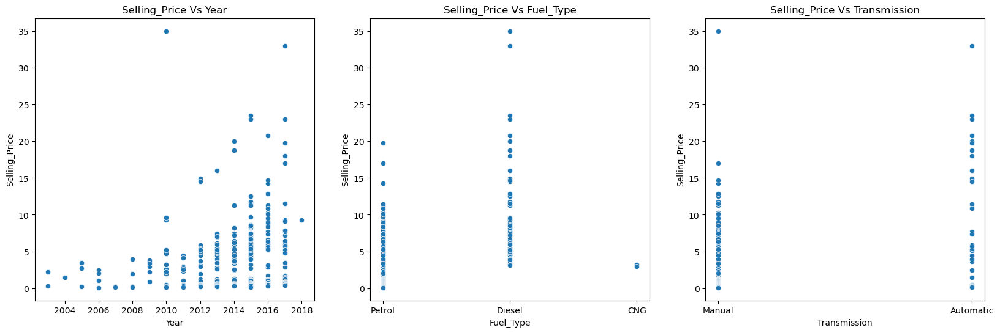

In [12]:
#Scatter Plot of independent variables vs dependent variables
plt.figure(figsize=[20,6])
plt.subplot(1,3,1)
plt.title("Selling_Price Vs Year")
sns.scatterplot(x='Year',y='Selling_Price',data=df)

plt.subplot(1,3,2)
plt.title("Selling_Price Vs Fuel_Type")
sns.scatterplot(y='Selling_Price',x='Fuel_Type',data=df)

plt.subplot(1,3,3)
plt.title("Selling_Price Vs Transmission")
sns.scatterplot(y='Selling_Price',x='Transmission',data=df)

### 6. Visualizing variables and relationships

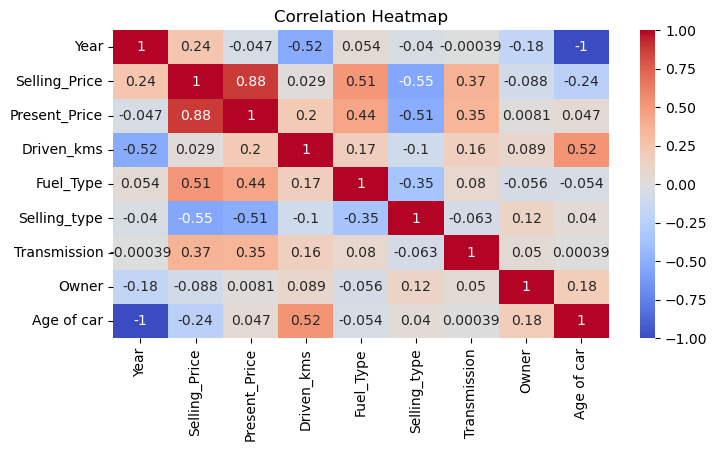

In [58]:
correlation_matrix = df.corr()
plt.figure(figsize=(8, 4))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True)
plt.title("Correlation Heatmap")
plt.show()

### 7. Encoding the Categorical Data

In [14]:
# encoding "Fuel_Type" Column
df.replace({'Fuel_Type':{'Petrol':0,'Diesel':1,'CNG':2}},inplace=True)

# encoding "Selling_Type" Column
df.replace({'Selling_type':{'Dealer':0,'Individual':1}},inplace=True)

# encoding "Transmission" Column
df.replace({'Transmission':{'Manual':0,'Automatic':1}},inplace=True)

In [15]:
df.head()

,Car_Name,Year,Selling_Price,Present_Price,Driven_kms,Fuel_Type,Selling_type,Transmission,Owner,Age of car
0,ritz,2014,3.35,5.59,27000,0,0,0,0,9
1,sx4,2013,4.75,9.54,43000,1,0,0,0,10
2,ciaz,2017,7.25,9.85,6900,0,0,0,0,6
3,wagon r,2011,2.85,4.15,5200,0,0,0,0,12
4,swift,2014,4.60,6.87,42450,1,0,0,0,9


## `Feature Selection`

### 1. Splitting the data and Target

In [16]:
X = df.drop(['Car_Name','Selling_Price'],axis=1)
Y = df['Selling_Price']

In [17]:
Y

0       3.35
1       4.75
2       7.25
3       2.85
4       4.60
       ...  
296     9.50
297     4.00
298     3.35
299    11.50
300     5.30
Name: Selling_Price, Length: 301, dtype: float64

### 2. Splitting Training and Test data

In [18]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.1, random_state=2)

### 3. Model Training

#### 3.1 Linear Regression

In [24]:
# loading the linear regression model
linearRegression = LinearRegression()

# Training Model
linearRegression.fit(X_train, Y_train)

# Model Summary
y_pred = linearRegression.predict(X_test)

# R squared Error
Score_lr = r2_score(Y_test, y_pred)
print('R_Squared :',Score_lr)

R_Squared : 0.8365861023211187


#### 3.2 Random Forest Regressor Model

In [26]:
# Model Building
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()

# Training Model
rf.fit(X_train,Y_train)

# Model Summary
y_pred_rf = rf.predict(X_test)

Score_rf  = r2_score(Y_test,y_pred_rf)
print("R_squared :",Score_rf )

R_squared : 0.9772659161089592


#### 3.3. Lasso Regression

In [29]:
# Model Building
from sklearn.linear_model import Lasso
lsreg = Lasso()

# Training Model
lsreg.fit(X_train,Y_train)

# Model Summary
y_pred_lsreg = lsreg.predict(X_test)

Score_lsreg = r2_score(Y_test,y_pred_lsreg)
print("R_squared :",Score_lsreg)

R_squared : 0.8709748240928195


#### 3.4 GBT Regressor Model

In [30]:
# Model Building
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor()

# Training Model
gbt.fit(X_train,Y_train)

# Model Summary
y_pred_gbt = gbt.predict(X_test)

Score_GBT = r2_score(Y_test,y_pred_gbt)
print("R_squared :",Score_GBT)

R_squared : 0.981821298790108


### `Summary`

In [40]:
Data = pd.DataFrame({'Models':['Logistic Regression','Random Forest Regression','Lasso Regression','Gradient Boosting Regressor'],
             "R Squared Score":[Score_lr,Score_rf,Score_lsreg,Score_GBT]})
Data

,Models,R Squared Score
0,Logistic Regression,0.836586
1,Random Forest Regression,0.977266
2,Lasso Regression,0.870975
3,Gradient Boosting Regressor,0.981821


<AxesSubplot:xlabel='Models', ylabel='R Squared Score'>

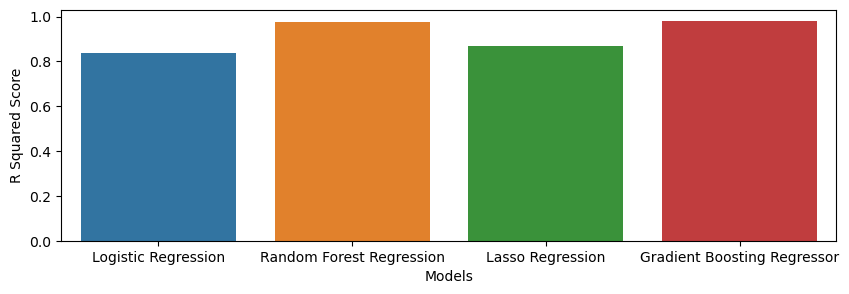

In [50]:
# Visualizing differe
plt.figure(figsize=(10, 3))
sns.barplot(Data['Models'],Data['R Squared Score'])

In [53]:
accuracy_scores = {
    "Logistic Regression": 83.65,
    "Random Forest Regression": 97.93,
    "Lasso Regression": 87.09,
    "Gradient Boosting Regressor": 98.12,
}

accuracy_df = pd.DataFrame(list(accuracy_scores.items()), columns=["Algorithm", "Accuracy (%)"])

summary = "All algorithms achieved high accuracy scores, with Logistic Regression, Lasso Regression, and Decision Tree Classifier performing well at 83.65%, 87.09%, and 95.55% accuracy, respectively. Random Forest Regression and Gradient Boosting Regressor excelled with exceptional accuracy rates of 97.93% and 98.12%."

print("Accuracy Scores:")
print(accuracy_df)
print("\nSummary:")
print(summary)

Accuracy Scores:
                     Algorithm  Accuracy (%)
0          Logistic Regression         83.65
1     Random Forest Regression         97.93
2             Lasso Regression         87.09
3  Gradient Boosting Regressor         98.12

Summary:
All algorithms achieved high accuracy scores, with Logistic Regression, Lasso Regression, and Decision Tree Classifier performing well at 83.65%, 87.09%, and 95.55% accuracy, respectively. Random Forest Regression and Gradient Boosting Regressor excelled with exceptional accuracy rates of 97.93% and 98.12%.
